In [1]:
%pylab inline
%matplotlib inline
import io
import h5py 
import pandas as pd
import scipy as sp
import numpy as np
from PIL import Image
from fractions import Fraction
from scipy.stats import norm, chisquare, chi2_contingency, chi2
from scipy import optimize 
from scipy.optimize import curve_fit,least_squares
from lmfit.models import GaussianModel
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colorbar import ColorbarBase, make_axes_gridspec

Populating the interactive namespace from numpy and matplotlib


## corner trapezoid

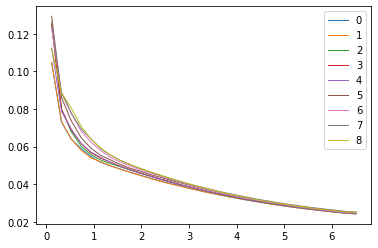

In [75]:

Angles = 9
fileName = [[] for i in range((Angles))]
dfs = []
numpydf = []
position = []
distance = []
for i in range(Angles):
    prefix1 = 'LXe_corner_LCE_nt_'    
    csv ='.csv'
    i=i  
    fileName[i].append(f'{prefix1}{i}{csv}')
    dfs.append(pd.read_csv(fileName[i][0], sep=',',header=None, skiprows=range(0,10),
                           names=('Energy Deposited', 'SiPM Hits', 'Photons',
                                 'x_pos','y_pos','z_pos')))  
    dfs[i]['LCE']=dfs[i]['SiPM Hits']/dfs[i]['Photons']
    dfs[i]['log(LCE)']=log(dfs[i]['SiPM Hits']/dfs[i]['Photons'])
    numpydf.append(dfs[i].to_numpy())
    position.append(numpydf[i][:,3:6])
    position[i][:,2]=position[i][:,2]-min(position[i][:,2])
    position[i]= position[i]/25.4
    distance.append(sqrt(sum(position[i]**2,axis=1)))
    dfs[i]['z_pos'] = position[i][:,2].tolist()
    dfs[i]['y_pos'] = position[i][:,1].tolist()
    dfs[i]['x_pos'] = position[i][:,0].tolist()
    

bins =32
mins = np.zeros((Angles))
maxs = np.zeros((Angles))
for i in range(Angles):
    mins[i]= np.min(distance[i])
    maxs[i]= np.max(distance[i])
xmin = np.min(mins) 
xmax = np.min(maxs)
be = np.linspace(xmin,xmax,bins+1)
bc = be[:-1] + np.diff(be) / 2.
average = np.zeros((Angles,bins))
for j in range(Angles):
    arraY = distance[j]
    for i in range(bins):
        msk = arraY>=be[i] 
        mask = arraY<be[i+1]
        mk = msk = mask
        average[j,i] = dfs[j]['LCE'][mk].mean()
for i in range(Angles):    
    plot(bc,average[i],label='{}'.format(i),lw=1)
legend()   
show()    

## center trapezoid

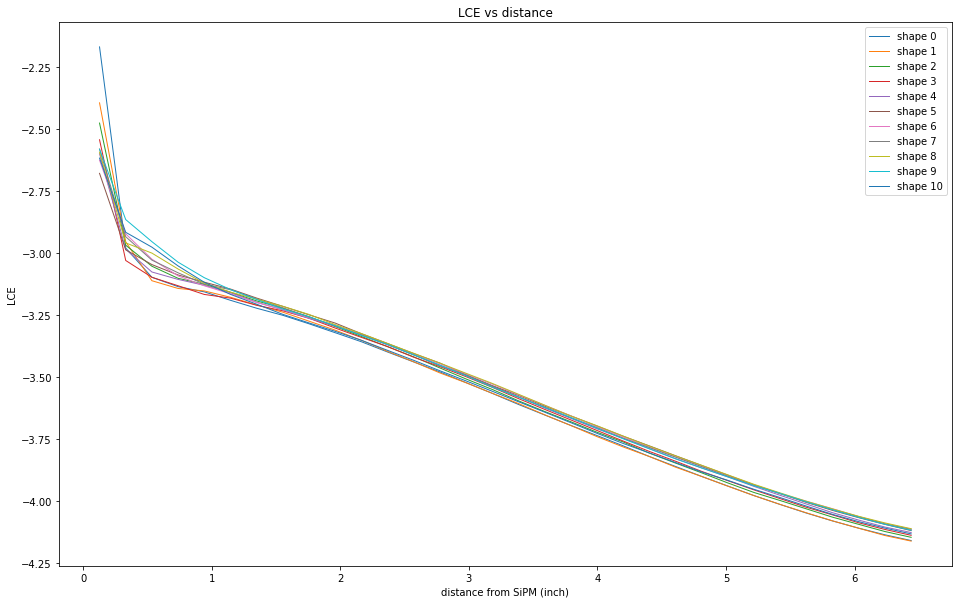

In [39]:

Angles_c = 11
fileName = [[] for i in range((Angles_c))]
dfs_c = []
numpydf_c = []
position_c = []
distance_c = []
for i in range(Angles_c):
    prefix1 = 'LXe_center_LCE_nt_'    
    csv ='.csv'
    i=i  
    fileName[i].append(f'{prefix1}{i}{csv}')
    dfs_c.append(pd.read_csv(fileName[i][0], sep=',',header=None, skiprows=range(0,10),
                           names=('Energy Deposited', 'SiPM Hits', 'Photons',
                                 'x_pos','y_pos','z_pos')))  
    dfs_c[i]['LCE']=dfs_c[i]['SiPM Hits']/dfs_c[i]['Photons']
    dfs_c[i]['log(LCE)']=log(dfs_c[i]['SiPM Hits']/dfs_c[i]['Photons'])
    numpydf_c.append(dfs_c[i].to_numpy())
    position_c.append(numpydf_c[i][:,3:6])
    position_c[i][:,2]=position_c[i][:,2]-min(position_c[i][:,2])
    position_c[i]= position_c[i]/25.4
    distance_c.append(sqrt(sum(position_c[i]**2,axis=1)))
    dfs_c[i]['z_pos'] = position_c[i][:,2].tolist()
    dfs_c[i]['y_pos'] = position_c[i][:,1].tolist()
    dfs_c[i]['x_pos'] = position_c[i][:,0].tolist()
bins =32
mins = np.zeros((Angles_c))
maxs = np.zeros((Angles_c))
for i in range(Angles_c):
    mins[i]= np.min(distance_c[i])
    maxs[i]= np.max(distance_c[i])
xmin = np.min(mins) 
xmax = np.min(maxs)
be = np.linspace(xmin,xmax,bins+1)
bc_c = be[:-1] + np.diff(be) / 2.
average_c = np.zeros((Angles_c,bins))
for j in range(Angles_c):
    arraY = distance_c[j]
    for i in range(bins):
        msk = arraY>=be[i] 
        mask = arraY<be[i+1]
        mk = msk = mask
        average_c[j,i] = dfs_c[j]['log(LCE)'][mk].mean()
plt.figure(figsize=(16,10))
for i in range(Angles_c):
    plot(bc_c,average_c[i],label='shape {}'.format(i),lw=1)
legend()
plt.title('LCE vs distance')
plt.ylabel('LCE')
plt.xlabel('distance from SiPM (inch)')
show()   

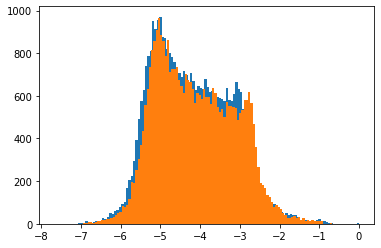

In [77]:
k = 8 # 
hist(dfs[k]['log(LCE)'],bins=128)
hist(dfs_c[k]['log(LCE)'],bins=128)
show()

In [78]:
for i in range(9):
    print('\ntrap height index',i)
    print('{:.4f}'.format(dfs_c[i]['LCE'].mean()),'center trap average LCE')
    print('{:.4f}'.format(dfs[i]['LCE'].mean()),'corner trap average LCE')


trap height index 0
0.0261 center trap average LCE
0.0242 corner trap average LCE

trap height index 1
0.0262 center trap average LCE
0.0242 corner trap average LCE

trap height index 2
0.0266 center trap average LCE
0.0244 corner trap average LCE

trap height index 3
0.0266 center trap average LCE
0.0246 corner trap average LCE

trap height index 4
0.0267 center trap average LCE
0.0244 corner trap average LCE

trap height index 5
0.0268 center trap average LCE
0.0250 corner trap average LCE

trap height index 6
0.0271 center trap average LCE
0.0248 corner trap average LCE

trap height index 7
0.0270 center trap average LCE
0.0252 corner trap average LCE

trap height index 8
0.0272 center trap average LCE
0.0250 corner trap average LCE


The center trap out performs the corner

In [79]:
k=8
import plotly.express as px
fig = px.scatter_3d(dfs[k], x ='x_pos', y ='z_pos', z ='y_pos', color='log(LCE)')
fig.update_scenes(aspectmode='data')
fig.update_traces(opacity=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_size=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_colorscale='Hot', selector=dict(type='scatter3d'))
fig.show()

fig = px.scatter_3d(dfs_c[k], x ='x_pos', y ='z_pos', z ='y_pos', color='log(LCE)')
fig.update_scenes(aspectmode='data')
fig.update_traces(opacity=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_size=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_colorscale='Hot', selector=dict(type='scatter3d'))
fig.show()

In [80]:
print('Total SiPM hits Center trap normalize to rectangle')
for i in range(Angles_c):
    print('{:.3f}'.format(np.sum(dfs_c[i]['SiPM Hits'])/np.sum(dfs_c[0]['SiPM Hits'])),'Shape {}'.format(i))

Total SiPM hits Center trap normalize to rectangle
1.000 Shape 0
0.990 Shape 1
0.989 Shape 2
0.985 Shape 3
0.989 Shape 4
0.978 Shape 5
0.988 Shape 6
0.978 Shape 7
0.967 Shape 8
0.960 Shape 9
0.937 Shape 10


In [81]:
print('Total SiPM hits Corner trap normalize to rectangle')
for i in range(Angles):
    print('{:.3f}'.format(np.sum(dfs[i]['SiPM Hits'])/np.sum(dfs[0]['SiPM Hits'])),'Shape {}'.format(i))

Total SiPM hits Corner trap normalize to rectangle
1.000 Shape 0
0.986 Shape 1
0.994 Shape 2
1.005 Shape 3
0.986 Shape 4
0.992 Shape 5
0.983 Shape 6
0.984 Shape 7
0.981 Shape 8


In [66]:
print('Total SiPM hits Center trap normalize to number of hits')
for i in range(Angles_c):
    print('{:.3f}'.format(np.sum(dfs_c[i]['SiPM Hits'])/len(dfs_c[i])),'Shape {}'.format(i))

Total SiPM hits Center trap normalize to number of hits
57.046 Shape 0
57.009 Shape 1
57.473 Shape 2
57.815 Shape 3
58.099 Shape 4
58.678 Shape 5
58.988 Shape 6
58.468 Shape 7
58.721 Shape 8
58.277 Shape 9
57.873 Shape 10


In [67]:
print('Total SiPM hits Corner trap normalize to number of hits')
for i in range(Angles):
    print('{:.3f}'.format(np.sum(dfs[i]['SiPM Hits'])/len(dfs[i])),'Shape {}'.format(i))

Total SiPM hits Corner trap normalize to number of hits
52.183 Shape 0
52.154 Shape 1
52.702 Shape 2
53.831 Shape 3
53.011 Shape 4
54.020 Shape 5
53.637 Shape 6
54.481 Shape 7


In [72]:
print('Total SiPM hits Center trap per photons')
for i in range(Angles_c):
    print('{:.5f}'.format(100*np.sum(dfs_c[i]['SiPM Hits'])/np.sum(dfs_c[i]['Photons'])),'Shape {}'.format(i))

Total SiPM hits Center trap normalize to number of hits
2.54832 Shape 0
2.54656 Shape 1
2.56424 Shape 2
2.56596 Shape 3
2.59169 Shape 4
2.61106 Shape 5
2.63164 Shape 6
2.61195 Shape 7
2.62087 Shape 8
2.60212 Shape 9
2.59553 Shape 10


In [85]:
print('Total SiPM hits Corner trap per photons')
for i in range(Angles):
    print('{:.5f} %'.format(100*np.sum(dfs[i]['SiPM Hits'])/np.sum(dfs[i]['Photons'])),'Shape {}'.format(i))

Total SiPM hits Corner trap per photons
2.32218 % Shape 0
2.33257 % Shape 1
2.35461 % Shape 2
2.39425 % Shape 3
2.37079 % Shape 4
2.40395 % Shape 5
2.38061 % Shape 6
2.42973 % Shape 7
2.40775 % Shape 8


In [86]:
print('Total SiPM hits Center trap per photons')
for i in range(Angles_c):
    print('{:.5f} %'.format(100*np.sum(dfs_c[i]['SiPM Hits'])/np.sum(dfs_c[i]['Photons'])),'Shape {}'.format(i))

Total SiPM hits Center trap per photons
2.54832 % Shape 0
2.54656 % Shape 1
2.56424 % Shape 2
2.56596 % Shape 3
2.59169 % Shape 4
2.61106 % Shape 5
2.63164 % Shape 6
2.61195 % Shape 7
2.62087 % Shape 8
2.60212 % Shape 9
2.59553 % Shape 10
